In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import plotly.express as px
from mpl_toolkits import basemap
import networkx as nx
from mpl_toolkits.basemap import Basemap as Basemap

# Visualización de la Información  - Proyecto 1
**Integrantes**
- Lucas Cedric Cervantes Beutelspacher
- Guillermo Gerardo Andrés Urbano
- Hugo Didier Longines Tapia
- Elsy Camila Silva Velázquez


## Introduccion

El Departamento de Transporte de los Estados Unidos abreviado como USDOT recibe informes de tr ́afico de
las aerol ́ıneas estadounidenses e internacionales que operan desde y hacia los aeropuertos estadounidenses. Cubren
los a ̃nos 1990 a 2020 (US Air Traffic 1990-2020).
Deseamos a conocer a partir de este conjunto informaci ́on acerca de los vuelos locales y extranjeros, ver el
comportamiento de las aerolineas a traves del tiempo, conocer las aerolineas con m ́as vuelos, ver el progreso en los
a ̃nos en cada aerolinea y ver el flujo de vuelos de las aerolineas.

**Objetivo**

El proyecto consiste en realizar una visualización de los datos para lo cual se deben presentar
varios __métodos de visualización__, pero es indispensable que uno de ellos sea que visualice redes
con posicionamiento geoespacial. Hay muchos datos en la base de datos y por ello, quizás, se
deben filtrar o limpiar además de que puede ser útil buscar alguna correlación para poder hacer
una visualización más informativa.

## Conjunto de datos - Pasajeros (International Report Passengers)

Antes de cualquier paso, profundizaremos más acerca de nuestro conjunto de datos, desde el nombre de las columnas y conjunto de valores que pueden tomar con el objetivo de entender mejor nuestro dataset.

|Nombre de la columna | Descripción |
|---|---|
|usg_apt_id | US Gateway Airport ID: asignado por el DOT de EE. UU. para identificar un aeropuerto|
|usg_apt | Código de aeropuerto de entrada de EE. UU.: generalmente asignado por IATA, pero en ausencia de la designación de IATA, puede mostrar el código asignado por la FAA|
|usg_wac | Código de área mundial de puerta de enlace de EE. UU.: asignado por el DOT de EE. UU. para representar un territorio geográfico |
|fg_apt_id | ID de aeropuerto de puerta de enlace extranjera: asignado por el DOT de EE. UU. para identificar un aeropuerto|
|fg_apt | Código de aeropuerto de puerta de enlace extranjera: generalmente asignado por IATA, pero en ausencia de la designación de IATA, puede mostrar el código asignado por la FAA |
|fg_wac | Código de área mundial de puerta de enlace extranjera: asignado por el DOT de EE. UU. para representar un territorio geográfico |
| airlineid | Identificación de la aerolínea: asignada por el DOT de EE. UU. para identificar una compañía aérea |
| carrier | Código de compañía aérea asignado por IATA. Si la aerolínea no tiene un código IATA, se puede usar un código asignado por la ICAO o la FAA |
| carriergroup	 | Código de grupo de transportista: 1 indica transportistas aéreos nacionales de EE. UU., 0 indica transportistas aéreos extranjeros |
| type | Define el tipo de las cuatro métricas en este informe |
|Scheduled | Métrica volada por operaciones de servicio programadas |
| Charter | Métrica volada por operaciones chárter |
|Total | Métrica total volada por servicio programado y operaciones chárter|

Más informacion: https://opendatanetwork.herokuapp.com/dataset/datahub.transportation.gov/xgub-n9bw

Leemos nuestro conjunto de datos:

In [ ]:
passengers = pd.read_csv("./data/International_Report_Passengers.csv")
passengers.tail()

,data_dte,Year,Month,usg_apt_id,usg_apt,usg_wac,fg_apt_id,fg_apt,fg_wac,airlineid,carrier,carriergroup,type,Scheduled,Charter,Total
680980,10/01/2015,2015,10,12478,JFK,22,12972,LHR,493,19540,BA,0,Passengers,130217,0,130217
680981,09/01/2014,2014,9,12478,JFK,22,12972,LHR,493,19540,BA,0,Passengers,132052,0,132052
680982,10/01/2014,2014,10,12478,JFK,22,12972,LHR,493,19540,BA,0,Passengers,132822,0,132822
680983,08/01/2014,2014,8,12478,JFK,22,12972,LHR,493,19540,BA,0,Passengers,134263,0,134263
680984,03/01/1990,1990,3,12478,JFK,22,12972,LHR,493,19540,BA,0,Passengers,149898,297,150195


### Visualización de aeropuertos fuera de EEUU con mas vuelos

En esta primera visualización veremos las llegadas de cada aeropuerto. Como tenemos una gran cantidad de aeropuertos con llegadas en nuestra base de datos nos limitaremos a mostrar aquellos que tienen más de 5000 llegadas registradas. 

In [ ]:
fg = pd.DataFrame(passengers['fg_apt_id'].unique(), columns=['id'])
fg['Count'] = passengers.groupby('fg_apt_id')['fg_apt_id'].count().values
names = []
for id in fg['id'].values:
    ns = passengers[passengers['fg_apt_id'] == id]
    ns = ns['fg_apt'].values
    if len(ns)>0:
        names.append(ns[0])
    else:
        names.append(None)

fg['Name'] = names
fg.head(5)

,id,Count,Name
0,11032,4,CUN
1,16085,2,YHZ
2,10411,3,AUA
3,16304,2,ZIH
4,11138,13,CRK


Text(0, 0.5, 'Numero de Vuelos')

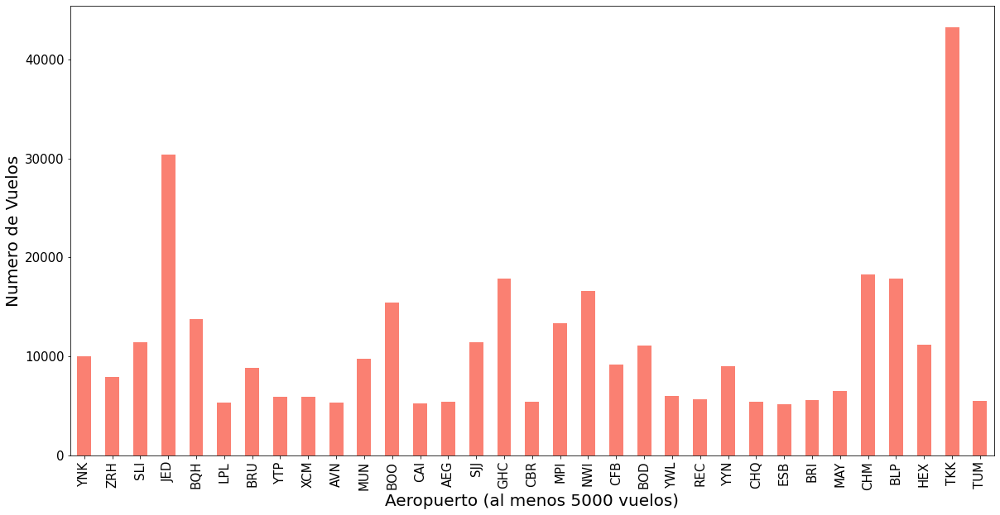

In [ ]:
mas_fg = fg[fg['Count']>=5000]
mas_fg.plot(kind='bar', x='Name',y='Count',
                 title='', figsize=(20,10), legend=False, color='salmon', fontsize = 15)
plt.xlabel('Aeropuerto (al menos 5000 vuelos)', fontsize=20)
plt.ylabel('Numero de Vuelos', fontsize=20)

Para esta visualización usamos los atributos relacionados con US Gateway Airport Code (usg\_apt). Con estos datos podemos hacer un conteo de cuantos registros tienen asignado un mismo código.
En total contamos con 832 aeropuertos diferentes dentro de EEUU en nuestra base de datos. Para poder tener una visualización clara vamos a seleccionar aquellos que tienen al menos 5000 vuelos registrados.

### Visualización de aeropuertos en EEUU con mas vuelos

En esta segunda visualización veremos las salidas de cada aeropuerto. Como tenemos una gran cantidad de aeropuertos con salidas en nuestra base de datos nos limitaremos a mostrar aquellos que tienen más de 5000 salidas registradas. 

In [ ]:
usg = pd.DataFrame(passengers['usg_apt_id'].unique(), columns=['id'])
usg['Count'] = passengers.groupby('usg_apt_id')['usg_apt_id'].count().values
names = []
for id in usg['id'].values:
    ns = passengers[passengers['usg_apt_id'] == id]
    ns = ns['usg_apt'].values
    if len(ns)>0:
        names.append(ns[0])
    else:
        names.append(None)

usg['Name'] = names
usg.head(5)

,id,Count,Name
0,14492,2,RDU
1,13204,341,MCO
2,11433,157,DTW
3,13487,174,MSP
4,12016,1,GUM


Text(0, 0.5, 'Numero de Vuelos')

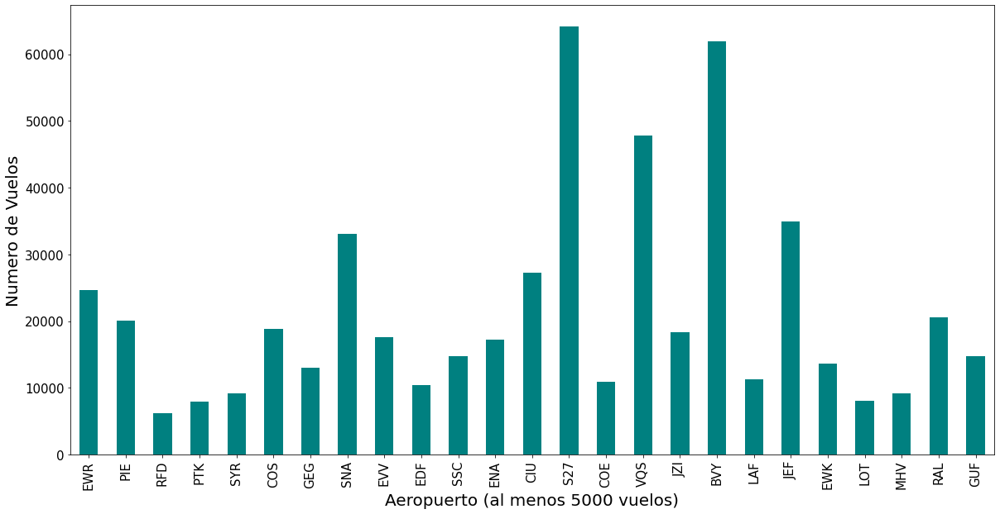

In [ ]:
mas_usg = usg[usg['Count']>=5000]
mas_usg.plot(kind='bar', x='Name',y='Count', 
                 title='', figsize=(20,10), legend=False, color='teal', fontsize = 15)
plt.xlabel('Aeropuerto (al menos 5000 vuelos)', fontsize=20)
plt.ylabel('Numero de Vuelos', fontsize=20)

Para esta visualización se tomaron los 5 aeropuertos en EEUU con más vuelos y se obtuvo sus coordenadas geográficas ya que en nuestra base de datos no se nos proporcionan. Una vez que ya tenemos sus coordenadas marcamos los puntos en donde se encuentra cada uno de los aeropuertos. 

### Visualización geográfica de los 5 aeropuertos con mas vuelos en EEUU

En esta tercera visualización observaremos las ubicaciones geográficas de los 5 aeropuertos con más salidas registradas. 

In [ ]:
from mpl_toolkits import basemap
print(basemap.__version__)

1.3.2


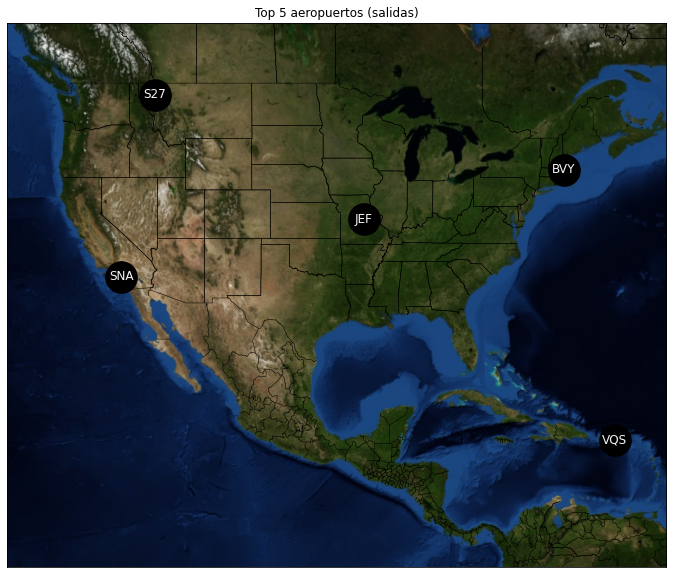

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt
from mpl_toolkits.basemap import Basemap as Basemap
m = Basemap(
        projection='merc',
        llcrnrlon=-130,
        llcrnrlat=5,
        urcrnrlon=-60,
        urcrnrlat=53,
        lat_ts=0,
        resolution='i',
        suppress_ticks=True)

lats=[48.178,42.584,18.134,38.591,33.675]
lons=[-114.303,-70.916,-65.493,-92.156,-117.868]

mx,my=m(lons,lats)

G=nx.Graph()
G.add_node('S27')
G.add_node('BVY')
G.add_node('VQS')
G.add_node('JEF')
G.add_node('SNA')

pos={}
pos['S27']=(mx[0],my[0])
pos['BVY']=(mx[1],my[1])
pos['VQS']=(mx[2],my[2])
pos['JEF']=(mx[3],my[3])
pos['SNA']=(mx[4],my[4])

plt.figure(figsize=(20,10))
nx.draw_networkx(G,pos,node_size=1000,edge_color='white', node_color='black', font_color="whitesmoke")

m.drawcountries()
m.drawstates()
m.bluemarble()
plt.title('Top 5 aeropuertos (salidas)')
plt.show()

Para esta visualización se tomaron los 5 aeropuertos en EEUU con más vuelos y se obtuvo sus coordenadas geográficas ya que en nuestra base de datos no se nos proporcionan. Una vez que ya tenemos sus coordenadas marcamos los puntos en donde se encuentra cada uno de los aeropuertos. 

### Visualización de aerolíneas con mas vuelos

Los datos que tenemos contienen una columna que es el identificador de las aerolíneas. Por lo tanto, si tenemos en nuestra base de datos todos los registros de vuelos, algo que nos podría interesar es saber que aerolínea es la que aparece mas en nuestros registros. 

In [ ]:
copia = passengers.copy()
aero = copia.loc[:,'airlineid']
aero1 = aero.to_frame()
aero2 = aero1.assign(Conteo=1)
aero3 = aero2.groupby('airlineid')['Conteo'].sum().reset_index()

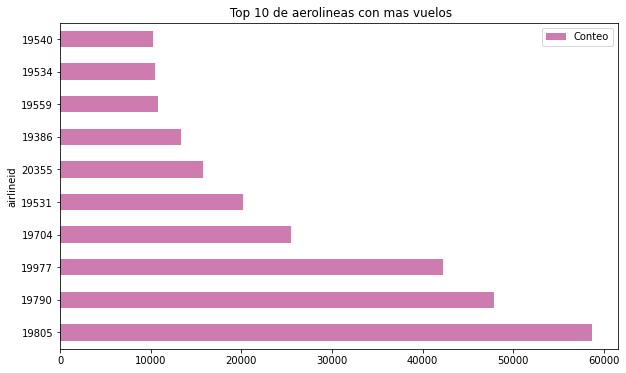

In [ ]:
aero3 = aero3.groupby('airlineid').sum()
aero3.sort_values(['Conteo'], ascending=False, axis=0, inplace=True)
top10 = aero3.head(10)
top10.plot(kind='barh', figsize=(10,6), color='#CE7BB0',
                    title=" Top 10 de aerolineas con mas vuelos");

Como podemos observar en la visualización, tenemos el top 10 de aerolíneas que mas aparecen en nuestra base de datos, cuando cada registro representa un vuelo. Para ello utilizamos los identificadores que vienen en nuestra base de datos los cuales representan alguna aerolínea en específico.

In [ ]:
copia = passengers.copy()
#copia.head()
tipo = copia.loc[:,'type']
tipo1 = tipo.to_frame()
tipo2 = tipo1.assign(Conteo=1)
tipo3 = tipo2.groupby('type')['Conteo'].sum().reset_index()
tipo3

,type,Conteo
0,Passengers,680985


### Visualización de vuelos por año 

Otra de las cosas que nos gustaría saber es la cantidad de vuelos que hay por año en nuestra base de datos. Aprovechando que no solo tenemos la fecha en formato de fecha, si no que también tenemos una columna específica donde está el año.

In [ ]:
copia = passengers.copy()
anios = copia.loc[:,'Year']
anios1 = anios.to_frame()
anios2 = anios1.assign(Conteo=1)
anios3 = anios2.groupby('Year')['Conteo'].sum().reset_index()

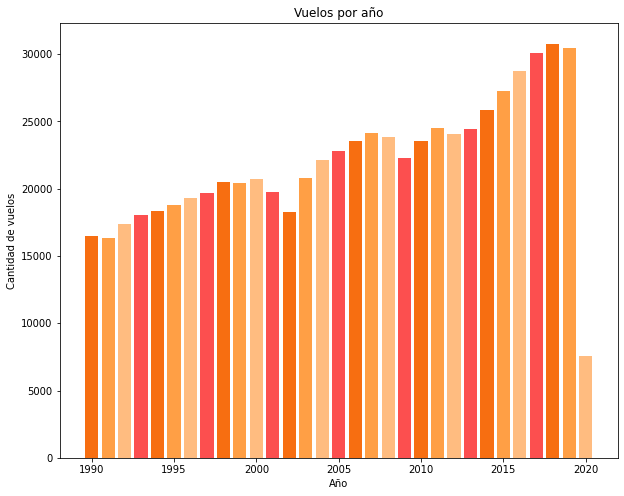

In [ ]:
plt.figure(figsize=(10,8))
#colors = ('indigo' , 'darkorchid', 'midnightblue', 'mediumblue', 'steelblue', 'deepskyblue', 'darkturquoise', 'cadetblue',  'teal', 'mediumaquamarine')
palettes2 = ['#F76E11', '#FF9F45', '#FFBC80', '#FC4F4F']
plt.bar(anios3['Year'], anios3['Conteo'], color=palettes2)
plt.title('Vuelos por año')
plt.xlabel('Año')
plt.ylabel('Cantidad de vuelos')
plt.show()

Aquí sucede algo interesante. Podemos observar como la cantidad de vuelos podríamos decir que es creciente a lo largo de los años, pero en el 2020 tiene una reducción bastante considerable.
A medida que la tecnología avanza se vuelve cada vez mas utilizada y barata. Cada vez se vuelve mas fácil de producir y vender a las masas. Podemos ver esto en la cantidad de personas que tienen un celular inteligente hoy en día o la cantidad de coches que existen en comparación a años anteriores. No es diferente para la aviación. Sin embargo, esta visualización nos permite confirmar la cantidad creciente de vuelos por año, pero sobre todo nos permite ver el caso particular de 2020.

Como sabemos, en el año 2020 comenzó la pandemia mundial causada por el COVID-19. Y una tendencia creciente en cuanto a la cantidad de vuelos que tenemos en nuestra base de datos dio un bajón importante. Podemos observar que por la pandemia mundial, la cantidad de vuelos fue menos de la mitad de la de 1990. Así que con esta visualización podemos observar como es que existe una anomalía y en caso hipotético de no saber que existió una pandemia en ese año, la misma visualización nos haría investigar la causa de la poca cantidad de vuelos. 

### Visualización de vuelos por mes

Este caso puede parecer muy similar al anterior, sin embargo nos da información completamente diferente. \
Ahora en vez de contar la cantidad de vuelos que hubieron por año, lo que hacemos es contar la cantidad que hubieron por mes en todos los años. De nuevo, esto es algo sencillo gracias a que nuestra base de datos contiene una columna la cual indica el mes nada mas, a parte de tener una columna la cual tenga le fecha. 

In [ ]:
copia = passengers.copy()
meses = copia.loc[:,'Month']
meses1 = meses.to_frame()
meses2 = meses1.assign(Conteo=1)
meses3 = meses2.groupby('Month')['Conteo'].sum().reset_index()

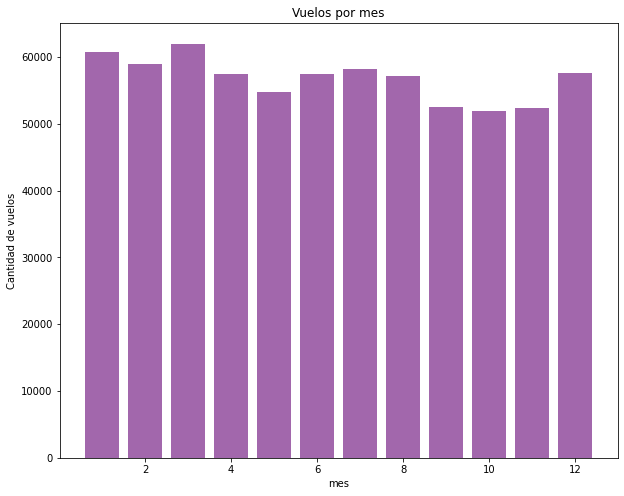

In [ ]:
plt.figure(figsize=(10,8))
#colors = ('indigo' , 'darkorchid', 'midnightblue', 'mediumblue', 'steelblue', 'deepskyblue', 'darkturquoise', 'cadetblue',  'teal', 'mediumaquamarine')
palettes4 = ['#6867AC', '#A267AC', '#CE7BB0', '#FFBCD1']
plt.bar(meses3['Month'], meses3['Conteo'], color=palettes4[1])
plt.title('Vuelos por mes')
plt.xlabel('mes')
plt.ylabel('Cantidad de vuelos')
plt.show()

omo podemos observar, en nuestra visualización los meses están indicados por números. Es decir, lo normal, enero es 1, febrero es 2, y así hasta el 12 que es diciembre. \
En la visualización queda de una forma clara que todos los mes (de nuestra base de datos) cumplen con la característica de sobrepasar la cantidad de 5000 mil vuelos. 
Teniendo en cuenta que esta visualización nos muestra la cantidad de vuelos por mes de todos los años, notamos como no existe una diferencia muy grande entre los meses. Es decir, no existe un valor muy abrupto como el de la visualización de vuelos por año. En este caso tampoco es que siga una tendencia aparente. De hecho si tuviéramos que comparar esta visualización a la de una variable aleatoria, lo primero que nos viene a la cabeza es la gráfica de una variable uniforme. \
A partir de esta visualización podríamos decir que en general, los vuelos por mes no varían mucho, es decir que cada vez consta de una cantidad similar de vuelos.

## Conjunto de datos - Salidas (International Report Departures)

Datos sobre todos los vuelos entre puertas de enlace de EE. UU. y fuera de EE. UU., independientemente del origen y el destino. Cada observación brinda información sobre una aerolínea específica para un par de aeropuertos, uno en los EE. UU. y el otro fuera. Existen tres columnas principales registran el número de vuelos a) Programados, b) Chárter y c) Totales.

In [ ]:
# Leemos nuestro conjunto de datos
departures = pd.read_csv("./data/International_Report_Departures.csv")
departures.tail()

,data_dte,Year,Month,usg_apt_id,usg_apt,usg_wac,fg_apt_id,fg_apt,fg_wac,airlineid,carrier,carriergroup,type,Scheduled,Charter,Total
930803,07/01/2000,2000,7,13303,MIA,33,13605,NAS,204,20398,MQ,1,Departures,1422,0,1422
930804,04/01/2019,2019,4,13303,MIA,33,14286,PTY,162,19770,CM,0,Departures,1439,0,1439
930805,08/01/2000,2000,8,13303,MIA,33,13605,NAS,204,20398,MQ,1,Departures,1441,0,1441
930806,09/01/2004,2004,9,12266,IAH,74,15632,VSA,148,19534,AM,0,Departures,1461,0,1461
930807,05/01/1996,1996,5,12478,JFK,22,14210,POS,280,19542,BW,0,Departures,2019,0,2019


## Preprocesamiento
Comprobamos si existes datos faltantes:

In [ ]:
print(f"Total registros: {len(departures)}")
print("Información de las columnas")
departures.info();

Total registros: 930808
Información de las columnas
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 930808 entries, 0 to 930807
Data columns (total 16 columns):
 #   Column        Non-Null Count   Dtype 
---  ------        --------------   ----- 
 0   data_dte      930808 non-null  object
 1   Year          930808 non-null  int64 
 2   Month         930808 non-null  int64 
 3   usg_apt_id    930808 non-null  int64 
 4   usg_apt       930808 non-null  object
 5   usg_wac       930808 non-null  int64 
 6   fg_apt_id     930808 non-null  int64 
 7   fg_apt        930808 non-null  object
 8   fg_wac        930808 non-null  int64 
 9   airlineid     930808 non-null  int64 
 10  carrier       927753 non-null  object
 11  carriergroup  930808 non-null  int64 
 12  type          930808 non-null  object
 13  Scheduled     930808 non-null  int64 
 14  Charter       930808 non-null  int64 
 15  Total         930808 non-null  int64 
dtypes: int64(11), object(5)
memory usage: 113.6+ MB


Vemos que precisamente la columna `carrier` contiene algunos datos nulos, ya que en la información sólo se registran $927753$ de un total de $930808$, por lo que llenaremos estos datos o eliminaremos según la cantidad de datos faltantes:

In [ ]:
print("Total de datos faltantes en carrier: {}".format(len(departures.carrier[departures.carrier.isna()])))

Total de datos faltantes en carrier: 3055


Eliminamos los registros NaN como primera instancia:

In [ ]:
departures_clened = departures.dropna()
#departures_clened.describe()
departures_clened

,data_dte,Year,Month,usg_apt_id,usg_apt,usg_wac,fg_apt_id,fg_apt,fg_wac,airlineid,carrier,carriergroup,type,Scheduled,Charter,Total
0,05/01/2006,2006,5,12016,GUM,5,13162,MAJ,844,20177,PFQ,1,Departures,0,10,10
1,05/01/2003,2003,5,10299,ANC,1,13856,OKO,736,20007,5Y,1,Departures,0,15,15
2,03/01/2007,2007,3,10721,BOS,13,12651,KEF,439,20402,GL,1,Departures,0,1,1
3,12/01/2004,2004,12,11259,DAL,74,16271,YYZ,936,20201,AMQ,1,Departures,0,1,1
4,05/01/2009,2009,5,13303,MIA,33,11075,CMW,219,21323,5L,0,Departures,0,20,20
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
930803,07/01/2000,2000,7,13303,MIA,33,13605,NAS,204,20398,MQ,1,Departures,1422,0,1422
930804,04/01/2019,2019,4,13303,MIA,33,14286,PTY,162,19770,CM,0,Departures,1439,0,1439
930805,08/01/2000,2000,8,13303,MIA,33,13605,NAS,204,20398,MQ,1,Departures,1441,0,1441
930806,09/01/2004,2004,9,12266,IAH,74,15632,VSA,148,19534,AM,0,Departures,1461,0,1461


In [ ]:
sns.set_theme(style="darkgrid")

### Visualización de correlaciones



Para entender mejor nuestro conjunto de datos, como primer paso hicimos una mapa de correlación entre las variables a través de su matriz de covarianza:

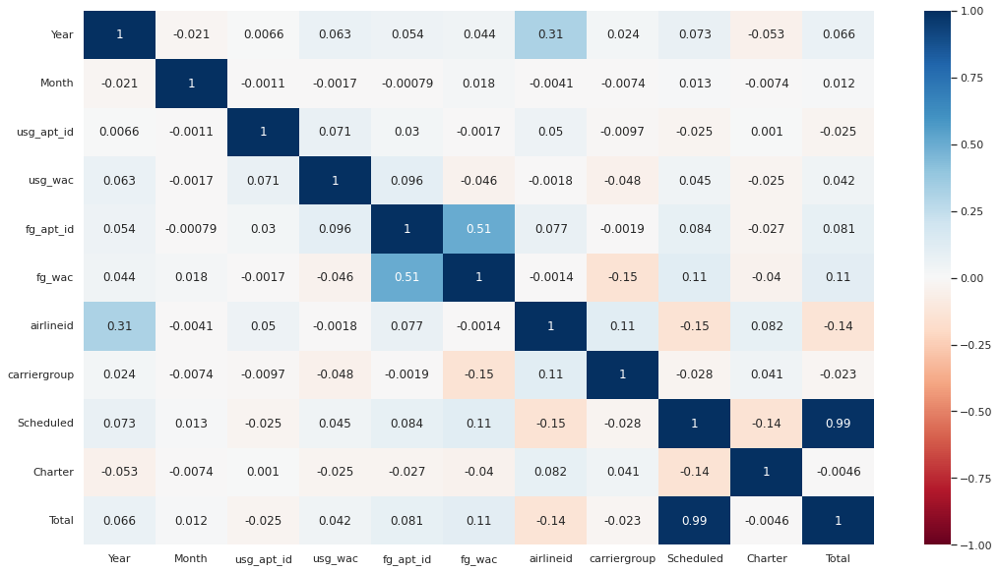

In [ ]:
covariance_matrix = departures_clened.corr()
plt.figure(figsize=(18,10))
sns.heatmap(covariance_matrix, annot=True, cmap="RdBu", vmin=-1.0);

Observamos a partir del mapa que las relaciones positivas más fuertes eran entre las variables Scheduled y Total.
Las demás variables parecer ser que no hay una relación muy fuerte entre ellas. Para nuestro mapa escogimos una paleta de colores clara utilizando el contraste con los los colores fuertes azul y rojo, de esta manera es fácil de observar que variables están fuertemente relacionadas ya sea positiva o negativamente.

### Visualización para salidas totales realizadas por operaciones de servicios programados por cada aeropuerto

Es importante conocer los vuelos totales de cada aeropuerto para de esta forma saber los más usados, y esto es posible gracias a los registros de que se ha tomado, utilizando los campos Scheduled, Charter y Total de nuestro conjunto de datos, podemos conocer la cantidad de viajes de las puertas Estados Unidos a hasta las puertas extranjeras de aeropuertos:

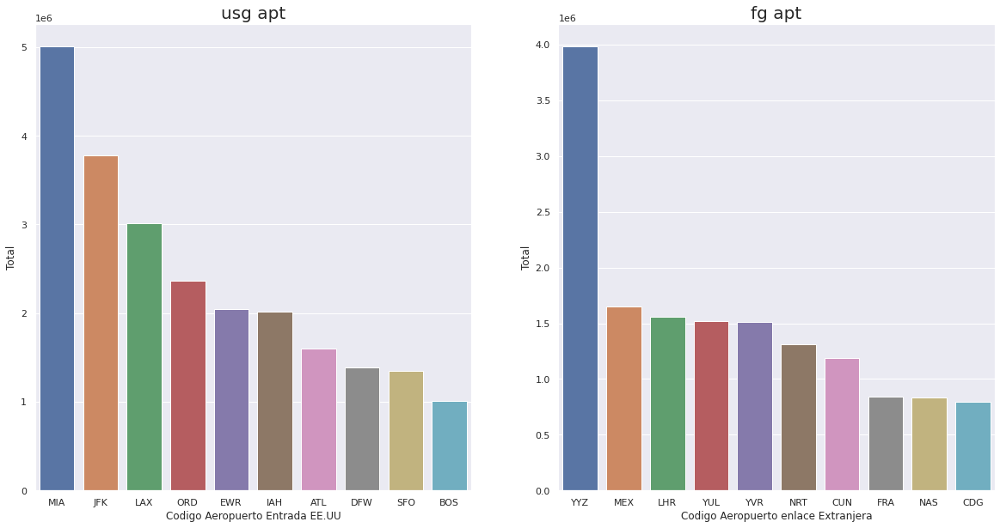

In [ ]:
# Agrupamos y obtenemos sus totales
usg_apt_sum = departures_clened[["usg_apt", "Scheduled", "Charter", "Total" ]].groupby("usg_apt").sum()
fg_apt_sum = departures_clened[["fg_apt", "Scheduled", "Charter", "Total" ]].groupby("fg_apt").sum()

# Ordenamos y obtenemos los primeros 10
top10_usg = usg_apt_sum.sort_values("Total", ascending=False)[:10]
top10_fg = fg_apt_sum.sort_values("Total", ascending=False)[:10]
top10_usg["Codigo Aeropuerto Entrada EE.UU"] = top10_usg.index
top10_fg["Codigo Aeropuerto enlace Extranjera"] = top10_fg.index

# Graficamos cada usg_apt y fg_apt
fig, axes = plt.subplots(1, 2, figsize=(20,10))
sns.barplot(data=top10_usg, x="Codigo Aeropuerto Entrada EE.UU",
            y="Total", ax=axes[0]).set_title("usg apt", fontsize=20);            

sns.barplot(data=top10_fg, x="Codigo Aeropuerto enlace Extranjera",
            y="Total", ax=axes[1]).set_title("fg apt", fontsize=20);

A través de nuestra visualización podemos ver que el aeropuerto de estados unidos que más viajes hace es el aeropuerto de Miami international seguido del aeropuerto de John.F.Kennedy de New York. Por otra parte podemos también observar los aeropuertos extranjeros a los que viajan, en este caso, vemos que el número uno es el aeropuerto de Lester B Pearson International en la ciudad de Toronto en Canada y segundo lugar el aeropuerto Licenciado Benito Juarez International de la Ciudad de México. Para distinguir los diferentes aeropuertos en la gráfica utilizamos diferentes colores para cada contenedor, de esta forma, podemos hacer énfasis que son instancias distintas utilizando colores claros en cada contenedor.

### Visualizando el comportado del aeropuerto de Miami a lo largo del tiempo

Ahora que sabemos que el aeropuerto que más viajes realiza es el de Miami podemos ver su éxito a lo largo del tiempo, es decir, ver si siempre ha sido el elegido por los clientes o ha ido mejorando a lo largo del tiempo.

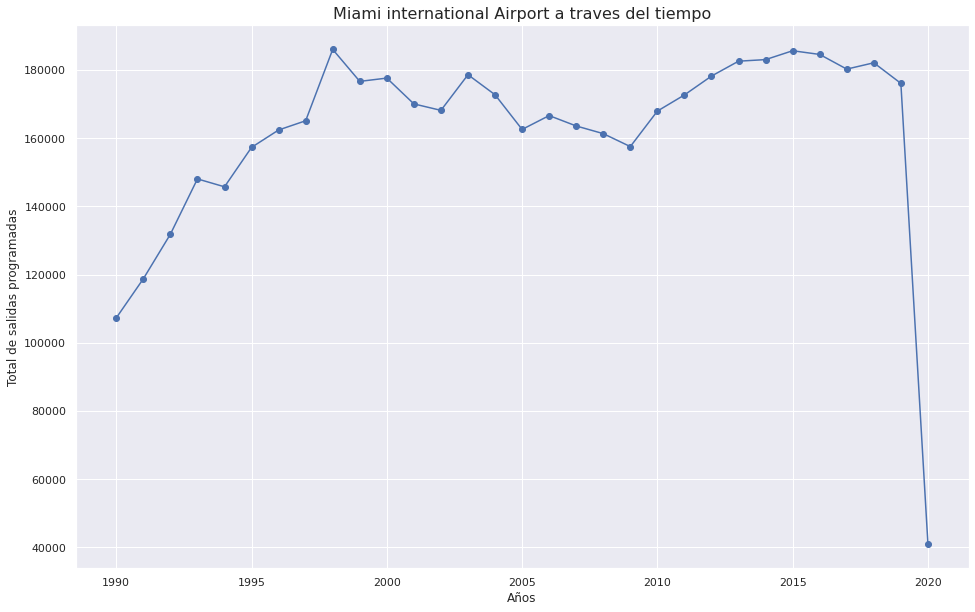

In [ ]:
mia_apt = departures_clened[departures_clened["usg_apt"] == "MIA"]
mia_apt_sum = mia_apt.sort_values("data_dte")[["Year", "Scheduled", "Charter", "Total" ]].groupby("Year").sum()

# Graficamos 
plt.subplots(figsize=(16,10))
plt.plot(mia_apt_sum.index, mia_apt_sum.Total, 'o-')
plt.title("Miami international Airport a traves del tiempo", fontsize=16)
plt.xlabel("Años")
plt.ylabel("Total de salidas programadas")
plt.show()

Vemos en nuestro visualización varias sorpresas, al parecer el aeropuerto de Miami no siempre tuvo una gran cantidad de vuelos, sino todo lo contrario, fue aumentando los vuelos a los largo de tiempo llegando a un máximo entre los año de 1995 a 1998, también observamos subidas y bajadas en nuestra gráfica hasta que en el año 2020 existe un mayor decremente en los vuelos del aeropuerto, esto da la visión que estaba en el top 10 de los aeropuerto con mayores viajes por los vuelos realizados a través del tiempo, es decir, en actualidad podemos esperar otros aeropuertos.
Por ultimo, hemos optado por esta visualizaciones utilizando colores y marcas simples, ya que estamos utilizando una serie de tiempo con las fechas registras. Con las marcas  de puntos podemos observar fácilmente las subidas y bajas en la gráfica.

### Visualización del Top 15 de Aeropuertos con mayor Número de Vuelos Programados.

Al momento de elegir un vuelo, queremos que éste sea en un aeropuerto de confianza y una de las maneras en que decidimos si es de confianza o no es revisando su historial: mientras más vuelos se hayan llevado a cabo, suponemos que el aeropuerto tiene más experiencia.

Con esto en mente, visualicemos los 15 aeropuertos con mayor número de vuelos programados (no chartér).

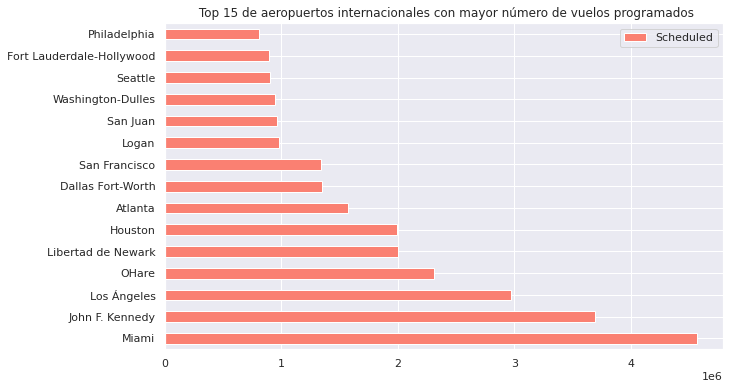

In [ ]:
aerop_v_program = departures_clened.loc[:, ['usg_apt', 'Scheduled']]
aerop_v_program = aerop_v_program.groupby('usg_apt').sum()

aerop_v_program.sort_values(['Scheduled'], ascending=False, axis=0, inplace=True)
v_progr_top15 = aerop_v_program.head(15)

#Cambiamos el 'usg_apt' por el nombre del aeropuerto
v_progr_top15.index = ['Miami','John F. Kennedy', 'Los Ángeles','OHare', 'Libertad de Newark','Houston','Atlanta','Dallas Fort-Worth',
    'San Francisco', 'Logan', 'San Juan','Washington-Dulles','Seattle','Fort Lauderdale-Hollywood', 'Philadelphia']
v_progr_top15.plot(kind='barh', figsize=(10,6), color='salmon',
                    title=" Top 15 de aeropuertos internacionales con mayor número de vuelos programados");

Como podemos observar, el Top 3 de aeropuertos se encuentra bastante lejos de los demás, llegando o sobrepasando los 3 millones de vuelos programados (que se tengan registro). Por lo anterior, si queremos un vuelo en un aeropuerto confiable, nuestras primeras opciones deberían ser el: Aerouerto Interdacional de Miami, 
Aerouerto Interdacional John F. Kennedy, Aerouerto Interdacional de Los Ángeles, en ese orden.

### Visualización del Top 15 de Aeropuertos con mayor Número de Vuelos Chárter

Al igual que en la visualización anterior, nos interesa conocer los aeropuertos con más experiencia (y más populares) en vuelos chárter aunque para estos, por ser vuelos privados, no debe ser muy necesario un top tan amplio ya que la mayor parte de vuelos seguro se concentra en unos cuantos aeropuertos.

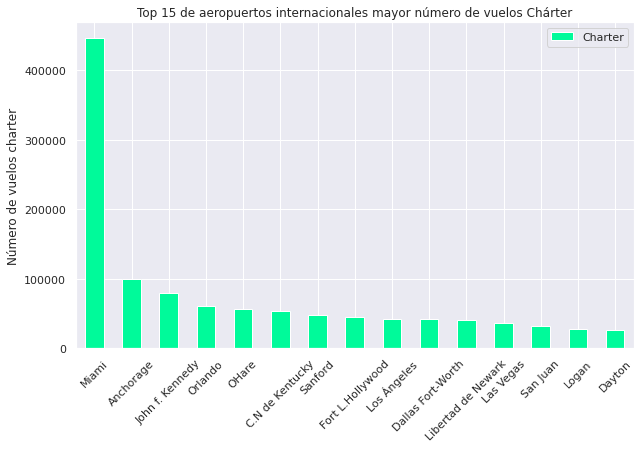

In [ ]:
aerop_v_char = departures_clened.loc[:, ['usg_apt', 'Charter']]
aerop_v_char = aerop_v_char.groupby('usg_apt').sum()


aerop_v_char.sort_values(['Charter'], ascending=False, axis=0, inplace=True)
v_char_top15 = aerop_v_char.head(15)

v_char_top15.index = ['Miami','Anchorage','John f. Kennedy','Orlando','OHare','C.N de Kentucky',
  'Sanford','Fort L.Hollywood','Los Ángeles','Dallas Fort-Worth','Libertad de Newark','Las Vegas',
  'San Juan','Logan','Dayton']

v_char_top15.plot(kind='bar', figsize=(10,6), color='mediumspringgreen',
                title = 'Top 15 de aeropuertos internacionales mayor número de vuelos Chárter',
                ylabel ='Número de vuelos charter',
                rot=45)
plt.show()                

Como habíamos pensado, la mayor parte de vuelos se concentra en un solo aeropuerto: el Aeropuerto Internacional de Miami, juntando más de 400,000 vuelos, mientras que la mayoría no pasa de los 50,000.

De esta manera, quedándonos con el Top 3 (que sobresalen un poco de los demás), habría que elgir entre el Aeropuerto Internacional John F. Kennedy con 79,759 vuelos programados, el Aeropuerto Internacional de Anchorage con 99,728 vuelos, y el Aeropuerto Internacional de Miami con 446,417.

### Visualización de la Ubicación de algunos Aeropuertos

Finalmente visualizaremos la ubicación de los aeropuertos analizados anteriormente (únicamente el Top 4 de ambos tipos de vuelos) para determinar si tienen alguna relación clara dada su ubicación.

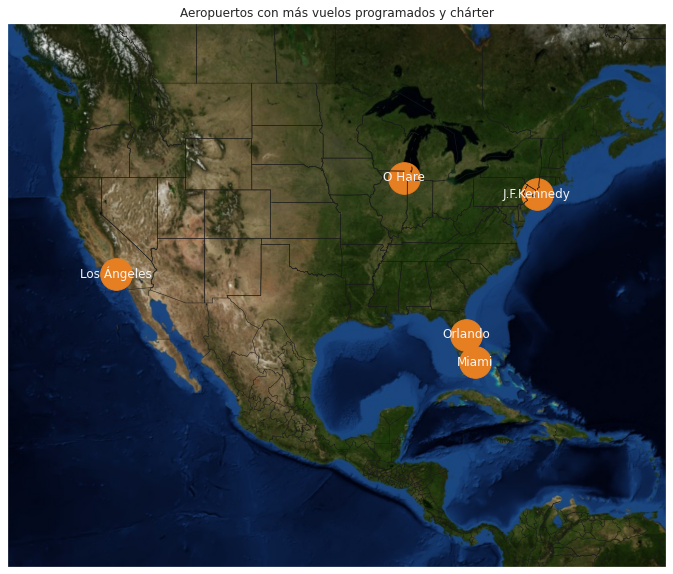

In [ ]:
k = Basemap(
        projection='merc',
        llcrnrlon=-130,
        llcrnrlat=5,
        urcrnrlon=-60,
        urcrnrlat=53,
        lat_ts=0,
        resolution='i',
        suppress_ticks=True)

latitudes=[25.79581768354474, 40.645127333886364, 33.940796626190576, 
           41.97883940591612, 61.17433546539371, 28.41669343402978]
longitudes=[-80.28779824468907, -73.78349843599673, -118.41039205820994, 
            -87.90963364552552, -149.99659287828825, -81.30577514277789]

kx,ky=k(longitudes,latitudes)

G=nx.Graph()
G.add_node('Miami')
G.add_node('J.F.Kennedy')
G.add_node('Los Ángeles')
G.add_node('O Hare')
G.add_node('Anchorage')
G.add_node('Orlando')

pos={}
pos['Miami']=(kx[0],ky[0])
pos['J.F.Kennedy']=(kx[1],ky[1])
pos['Los Ángeles']=(kx[2],ky[2])
pos['O Hare']=(kx[3],ky[3])
pos['Anchorage']=(kx[4],ky[4])
pos['Orlando']=(kx[5],ky[5])

plt.figure(figsize=(20,10))
nx.draw_networkx(G,pos,node_size=1000, node_color='#E67E22', font_color="whitesmoke")

m.drawcountries()
m.drawstates()
m.bluemarble()
plt.title('Aeropuertos con más vuelos programados y chárter')
plt.show()

Como podemos observar, únicamente se visualizan 5 de los 6 aeropuertos con más vuelos, esto se debe a que el aeropuerto internacional 'Anchorage' se ubica en Alaska. Ahora bien, vemos que los aeropuertos están distribuidos en todo el territorio Estadounidense (incluyendo a Alaska), por lo que concluimos los vuelos se concentran en un sólo aeropuerto internacional por cada zona de los Estados Unidos.

## Visualización de los vuelos del aeropuerto Miami international

Para dibujar los vuelos en nuestro conjunto de datos, necesitamos las coordenadas de los aeropuertos por lo que haremos un join de nuestros datos a una tabla con el mismo id que contengan las coordenadas usando una base de datos externa.

In [ ]:
# Obtenemos coordenadas y nombres de los aeropuertos
global_airport = pd.read_csv('data/GlobalAirportDatabase.txt', sep=":", header=None,
                            usecols=[1,2,3,4,14,15],
                            names=['usg_apt','name_airport', 'city', 'country', 'latitude', 'longitude'])
global_airport.head()

,usg_apt,name_airport,city,country,latitude,longitude
0,GKA,GOROKA,GOROKA,PAPUA NEW GUINEA,-6.082,145.392
1,LAE,NaN,LAE,PAPUA NEW GUINEA,0.000,0.000
2,MAG,MADANG,MADANG,PAPUA NEW GUINEA,-5.207,145.789
3,HGU,MOUNT HAGEN,MOUNT HAGEN,PAPUA NEW GUINEA,-5.826,144.296
4,LAE,NADZAB,NADZAB,PAPUA NEW GUINEA,-6.570,146.726


In [ ]:
global_airport[global_airport['usg_apt'] == 'MIA']

,usg_apt,name_airport,city,country,latitude,longitude
3636,MIA,MIAMI INTERNATIONAL,MIAMI,USA,25.793,-80.291


Haremos nuestro prueba con el aeropuerto de MIAMI que ya como hemos visto es el aeropuerto que mayor salidas que los demas.

In [ ]:
mia_airport = departures_clened[departures_clened['usg_apt'] == 'MIA'][['usg_apt', 'fg_apt', 'Total']]
mia_left = pd.merge(mia_airport, global_airport, left_on='usg_apt', right_on='usg_apt', how='left')
mia_coord = pd.merge(mia_left, global_airport, left_on='fg_apt', right_on='usg_apt', how='left')

Observamos que tenemos algunos valores faltantes, los descartaremos para nuestro analisis:

In [ ]:
mia_coord_cleaned = mia_coord.dropna()
mia_coord_cleaned

,usg_apt_x,fg_apt,Total,name_airport_x,city_x,country_x,latitude_x,longitude_x,usg_apt_y,name_airport_y,city_y,country_y,latitude_y,longitude_y
0,MIA,CMW,20,MIAMI INTERNATIONAL,MIAMI,USA,25.793,-80.291,CMW,IGNACIO AGRAMONTE INTERNATIONAL,CAMAGUEY,CUBA,21.420,-77.847
1,MIA,RSD,1,MIAMI INTERNATIONAL,MIAMI,USA,25.793,-80.291,RSD,ROCK SOUND,ROCK SOUND,BAHAMAS,24.892,-76.178
2,MIA,SAL,2,MIAMI INTERNATIONAL,MIAMI,USA,25.793,-80.291,SAL,EL SALVADOR INTERNATIONAL,SAN SALVADOR,EL SALVADOR,13.441,-89.056
3,MIA,PTY,5,MIAMI INTERNATIONAL,MIAMI,USA,25.793,-80.291,PTY,TOCUMEN INTERNATIONAL,PANAMA CITY,PANAMA,9.071,-79.383
4,MIA,SJO,3,MIAMI INTERNATIONAL,MIAMI,USA,25.793,-80.291,SJO,JUAN SANTAMARIA INTERNATIONAL,SAN JOSE,COSTA RICA,9.994,-84.209
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
140264,MIA,NAS,1308,MIAMI INTERNATIONAL,MIAMI,USA,25.793,-80.291,NAS,NASSAU INTERNATIONAL,NASSAU,BAHAMAS,25.039,-77.466
140265,MIA,NAS,1328,MIAMI INTERNATIONAL,MIAMI,USA,25.793,-80.291,NAS,NASSAU INTERNATIONAL,NASSAU,BAHAMAS,25.039,-77.466
140266,MIA,NAS,1422,MIAMI INTERNATIONAL,MIAMI,USA,25.793,-80.291,NAS,NASSAU INTERNATIONAL,NASSAU,BAHAMAS,25.039,-77.466
140267,MIA,PTY,1439,MIAMI INTERNATIONAL,MIAMI,USA,25.793,-80.291,PTY,TOCUMEN INTERNATIONAL,PANAMA CITY,PANAMA,9.071,-79.383


Ahora que tenemos las coordenadas de nuestros aeropuertos podemos hacer una visualización


In [ ]:
# Obtenemos las coordenadas de Mimi
mia_coor_x, mia_coor_y = mia_coord_cleaned.latitude_x[0], mia_coord_cleaned.longitude_y[0]
mia_name = mia_coord_cleaned.name_airport_x[0]

In [ ]:
# Obtenemos las coordenas de los aeropuertos extranjeros
mia_fg_names = mia_coord_cleaned.name_airport_y.values
mia_fg_coor_x = mia_coord_cleaned.latitude_y.values
mia_fg_coor_y = mia_coord_cleaned.longitude_y.values

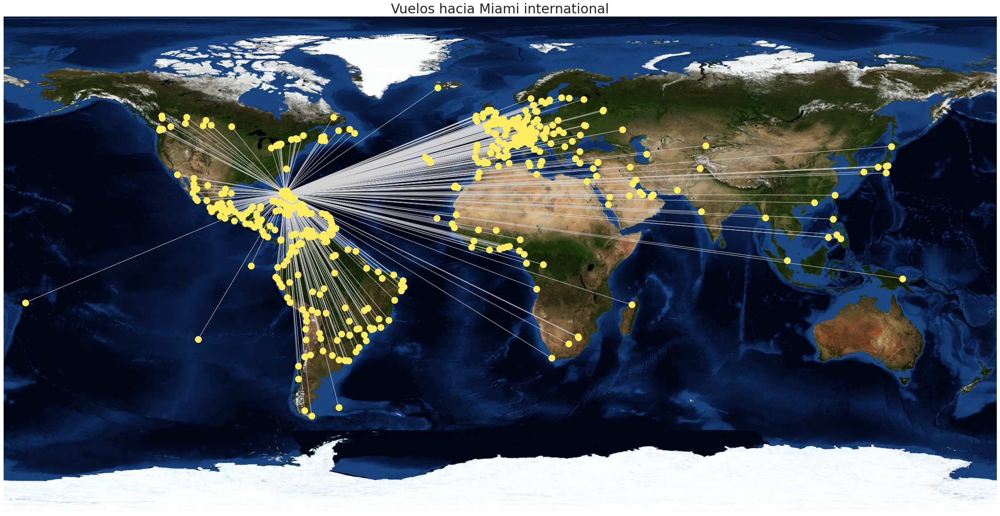

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt
from mpl_toolkits.basemap import Basemap as Basemap
m = Basemap(
        projection='merc',
        llcrnrlon=-130,
        llcrnrlat=25,
        urcrnrlon=-60,
        urcrnrlat=50,
        lat_ts=0,
        resolution='i',
        suppress_ticks=True)

m = Basemap(projection='cyl', resolution=None,
            llcrnrlat=-90, urcrnrlat=90,
            llcrnrlon=-180, urcrnrlon=180, )

# posición en decimal latitud/longitud 
lats=[mia_coor_x,*mia_fg_coor_x]
lons=[mia_coor_y, *mia_fg_coor_y]

# convertir latitud y longitud a proyección de mapa
mx,my=m(lons,lats)

# La parte de Red X
# Poner las coordenadas de proyección del mapa en el diccionario "pos"
G=nx.Graph()

# Generamos las aristar de los vuelos
for name_airport in mia_fg_names:
    G.add_edge(mia_name, name_airport)

pos={}
# Posicione del aeropuerto de Miami
pos[mia_name]=(mx[0],my[0])

# Ubicacion de los demas aeropuertos
for i, name_airport in enumerate(mia_fg_names):
    pos[name_airport]=(mx[i+1], my[i+1])



# Definir características
#nx.draw_networkx(G,pos,node_size=200,edge_color='lightgray', node_color='lightgray')
plt.figure(figsize=(40,40))
nx.draw_networkx(G,pos,node_size=200, node_color='#ffec60',
                 edge_color='lightgray', font_color="whitesmoke", with_labels=False)

# Ahora dibujar el mapa
m.bluemarble()
plt.title('Vuelos hacia el aeropuerto de Miami international', fontsize=30)
plt.show()

### Zoom al mapa de los Estados Unidos

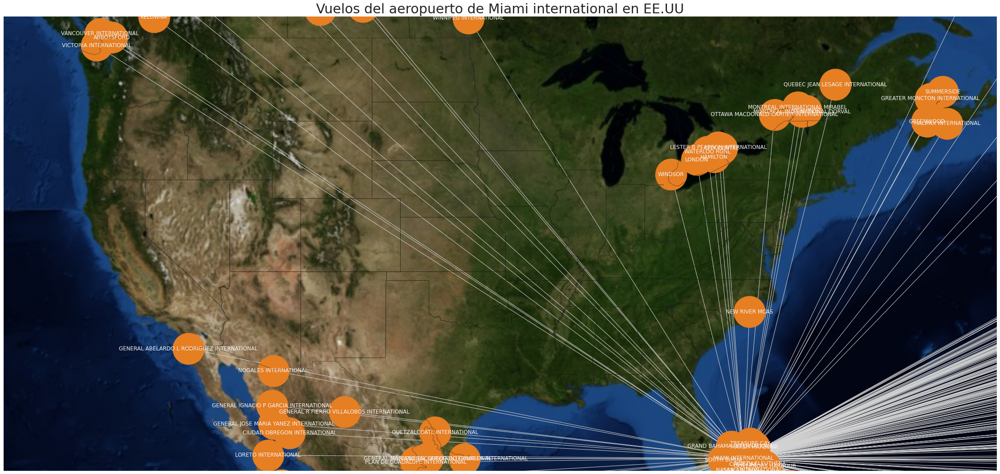

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt
from mpl_toolkits.basemap import Basemap as Basemap
m = Basemap(
        projection='merc',
        llcrnrlon=-130,
        llcrnrlat=25,
        urcrnrlon=-60,
        urcrnrlat=50,
        lat_ts=0,
        resolution='i',
        suppress_ticks=True)

# posición en decimal latitud/longitud 
lats=[mia_coor_x,*mia_fg_coor_x]
lons=[mia_coor_y, *mia_fg_coor_y]

# convertir latitud y longitud a proyección de mapa
mx,my=m(lons,lats)

# La parte de Red X
# Poner las coordenadas de proyección del mapa en el diccionario "pos"
G=nx.Graph()

# Generamos las aristar de los vuelos
for name_airport in mia_fg_names:
    G.add_edge(mia_name, name_airport)

pos={}
# Posicione del aeropuerto de Miami
pos[mia_name]=(mx[0],my[0])

# Ubicacion de los demas aeropuertos
for i, name_airport in enumerate(mia_fg_names):
    pos[name_airport]=(mx[i+1], my[i+1])



# Definir características
#nx.draw_networkx(G,pos,node_size=200,edge_color='lightgray', node_color='lightgray')
plt.figure(figsize=(40,40))
nx.draw_networkx(G,pos,node_size=5000, node_color='#E67E22',
                 edge_color='lightgray', font_color="whitesmoke")

# Ahora dibujar el mapa
m.drawcountries()
m.drawstates()
m.bluemarble()
plt.title('Vuelos del aeropuerto de Miami international en EE.UU', fontsize=30)
plt.show()

Para finalizar nuestro análisis sobre el aeropuerto de Miami decidimos visualizar los vuelos a través de una gráfica donde cada nodo son los aeropuertos extranjeros a donde se llegará, de esta podemos ver los viaje a través de las aristas de nuestro gráfica. Para una mejor visualización decidimos usar un mapa para proyectar los nodos y las aristas. Esto nos ayuda ver el trafico de los vuelos en este aeropuerto.

## Referencias
[1] Wilke, Claus O.: Fundamentals of Data Visualization, O Reilly, 2019.

[2] Seaborn: User guide. https://seaborn.pydata.org/. Accedido en Abril 24 del 2022.

[3] Database, Airport: User guide. https://www.partow.net/miscellaneous/airportdatabase/index.html.
Accedido en Abril 24 del 2022

<a style='text-decoration:none;line-height:16px;display:flex;color:#5B5B62;padding:10px;justify-content:end;' href='https://deepnote.com?utm_source=created-in-deepnote-cell&projectId=13853cea-fe70-48fe-93bf-666cb5f7137b' target="_blank">
 </img>
Created in <span style='font-weight:600;margin-left:4px;'>Deepnote</span></a>